***Projekt - Segmentacja obrazów***

Zespół: 
- Przemysław Klejno - lider zespołu
- Karol Hadzicki 
- Marcin Jakubik 

Projekt trakruje o segmentacji zdjęć satelitarnych. Wykrywane elementy to: 
- auta 
- drzewa 
- drogi 
- budynki 
- zniorniki wodne 
- trawniki 
- ludzie 


Segmentacja obrazów obdywa się przy użyciu modelu YOLO v8 (You Only Look Once version 8). 

1. Pierwszym krokiem jest instalacja YOLOv8 z biblioteki Ultralytics. Można to zrobić za pomocą komendy "pip install ultralytics". 

2. Drugim krokiem jest przygotowanie danych w katalogach. Struktura danych wygląda następująco: 

```
./segmentacja/data/
├── images/
│   ├── train/
│   └── val/
├── labels/
│   ├── train/
│   └── val/

```


Images są to zdjęcia satelitarne bądź zdjęcia z dronów w formacie .jpg lub .png.
Labels są to pliki w formacie .txt. Są to wielokąty (polygons), które opisują maski danych tzn. kontury konkretnych obiektów na obrazie. 

Zródła danych:
- zrzuty ekranu z google maps
- https://www.kaggle.com/datasets/bulentsiyah/semantic-drone-dataset?fbclid=IwAR3ORVTfBg9zUELkaKkgwLPp4Bk8-DYXRlDrB5PO4Ah9n5mJ74LWjDu7KhM
- https://www.kaggle.com/datasets/franciscoescobar/satellite-images-of-water-bodies
- https://www.kaggle.com/datasets/balraj98/massachusetts-buildings-dataset



3. Kolejnym krokiem jest trening modelu. Potrzeba do tego: 
- przygotowanych danych
- pliku konfiguracyjnego
- pliku train.py

Plik konfiguracyjny w naszym przypadku wygląda następująco: 

path: ./images

train: images/train
 
val: images/val  

names: 
  0: car
  1: forest
  2: road
  3: building
  4: water
  5: grass
  6: person

Kod trenigowy zawarty w train.py: 


``` python
from ultralytics import YOLO
model = YOLO('yolov8n-seg.pt')  # load a pretrained model (recommended for training)
model.train(data='config.yaml', epochs=70, imgsz=640, boxes = False)

```

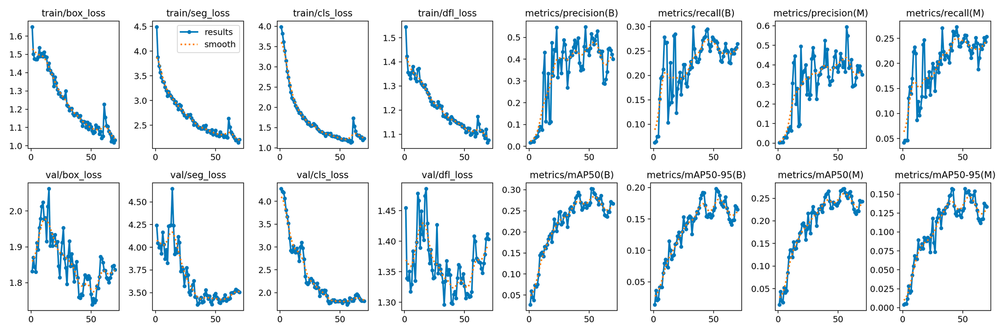

4. Po wytrenowania modelu można przystąpić do segmentacji. W tym celu należy użyć pliku predict.py. Jest to pierwsza werja predykcji z włączonymi ramkami (zamciemniają one rezultaty). Kod poniżej. 

In [1]:
from ultralytics import YOLO
import cv2

In [2]:
model_path = 'runs/segment/train20/weights/best.pt'
image_path = 'test_wyspamlynska.png'

img = cv2.imread(image_path)
height, width, _ = img.shape

model = YOLO(model_path)
results = model(image_path, save_conf=True, boxes = False)

for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.save(filename='result_wyspamlynska.png')  # save to disk

WARNING  'boxes' is deprecated and will be removed in 'ultralytics 8.399999999999999' in the future. Please use 'show_boxes' instead.

image 1/1 c:\Users\karol\Pulpit\presentation_image_segmentation\test_wyspamlynska.png: 320x640 28 forests, 31 buildings, 1 water, 5 grasss, 136.0ms
Speed: 4.5ms preprocess, 136.0ms inference, 1244.7ms postprocess per image at shape (1, 3, 320, 640)


Zdjęcie wejściowe: 

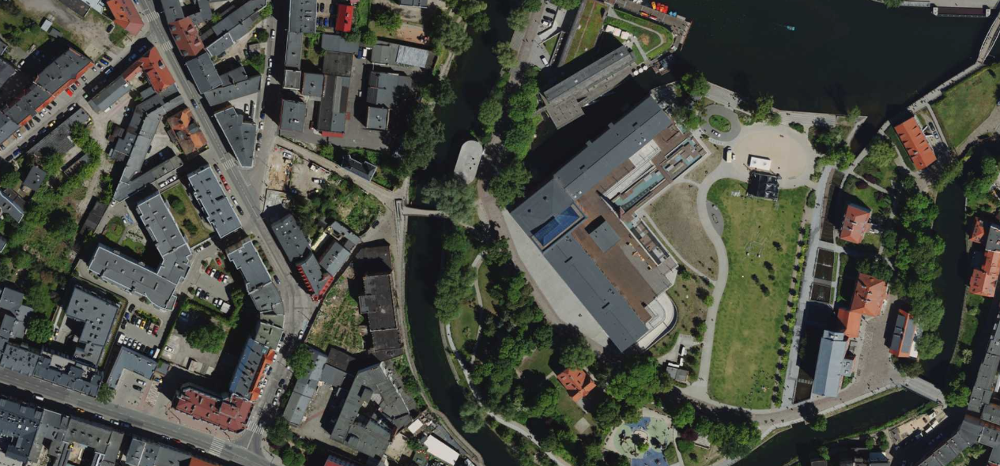





Zdjęcie wyjściowe: 

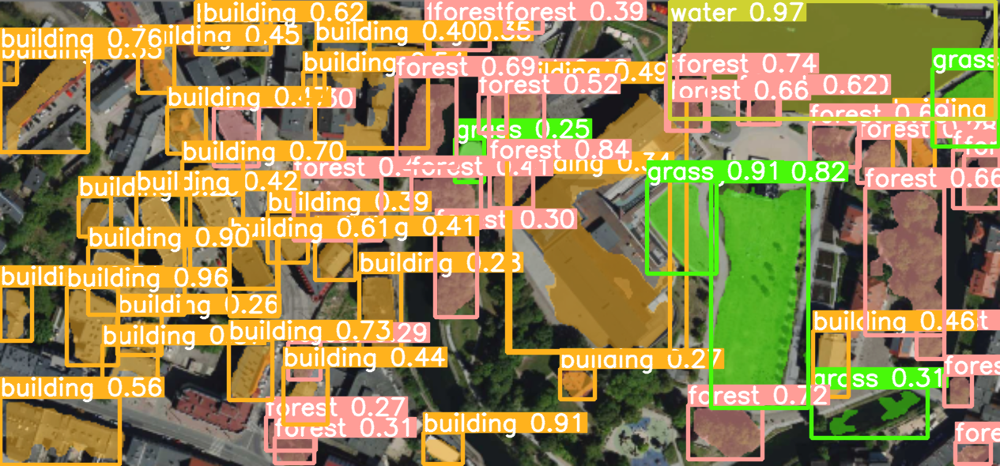

In [3]:
from ultralytics import YOLO
import cv2

model_path = 'runs/segment/train20/weights/best.pt'
image_path = 'test_UAM.png'

img = cv2.imread(image_path)
height, width, _ = img.shape

model = YOLO(model_path)
results = model(image_path, save_conf=True, boxes = False)

for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.save(filename='result_UAM.png')  # save to disk

WARNING  'boxes' is deprecated and will be removed in 'ultralytics 8.399999999999999' in the future. Please use 'show_boxes' instead.

image 1/1 c:\Users\karol\Pulpit\presentation_image_segmentation\test_UAM.png: 288x640 1 car, 12 forests, 1 road, 8 buildings, 4 grasss, 144.4ms
Speed: 3.1ms preprocess, 144.4ms inference, 30.0ms postprocess per image at shape (1, 3, 288, 640)


Zdjęcie wejściowe: 
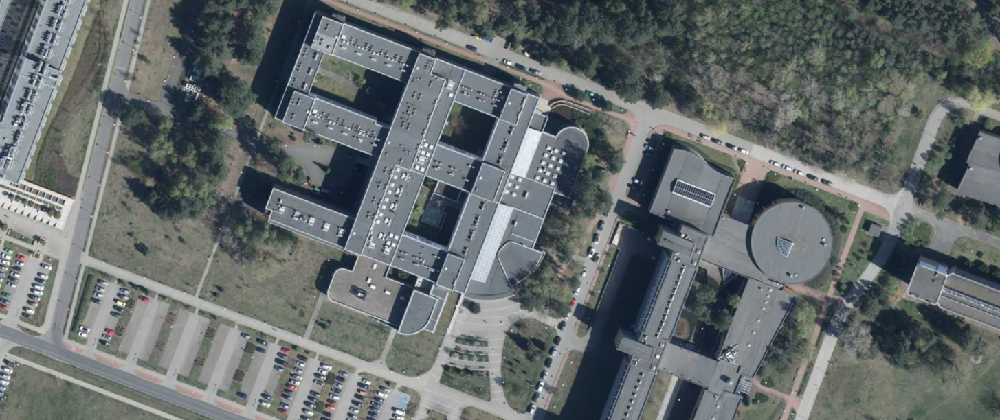

Zdjęcie wyjściowe: 
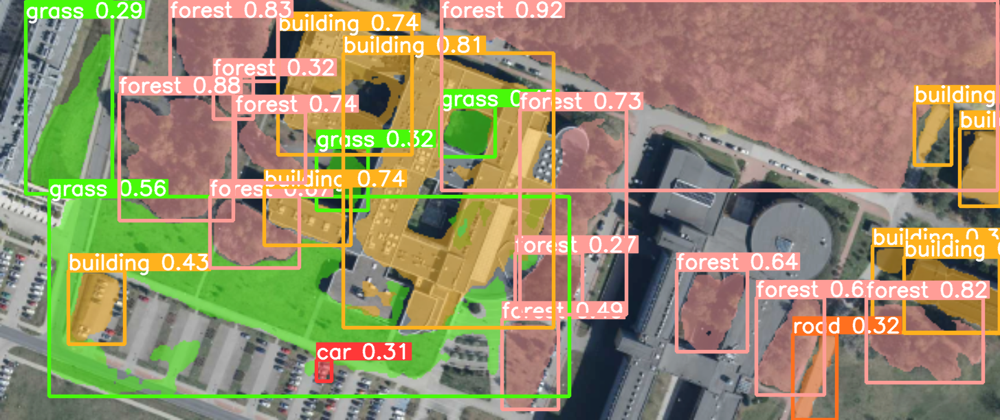

In [4]:
from ultralytics import YOLO
import cv2

model_path = 'runs/segment/train20/weights/best.pt'
image_path = 'test_most.png'

img = cv2.imread(image_path)
height, width, _ = img.shape

model = YOLO(model_path)
results = model(image_path, save_conf=True, boxes = False)

for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.save(filename='result_most.png')  # save to disk

WARNING  'boxes' is deprecated and will be removed in 'ultralytics 8.399999999999999' in the future. Please use 'show_boxes' instead.

image 1/1 c:\Users\karol\Pulpit\presentation_image_segmentation\test_most.png: 384x640 7 cars, 5 forests, 1 road, 2 waters, 2 grasss, 204.8ms
Speed: 4.0ms preprocess, 204.8ms inference, 15.0ms postprocess per image at shape (1, 3, 384, 640)


Zdjęcie wejściowe:
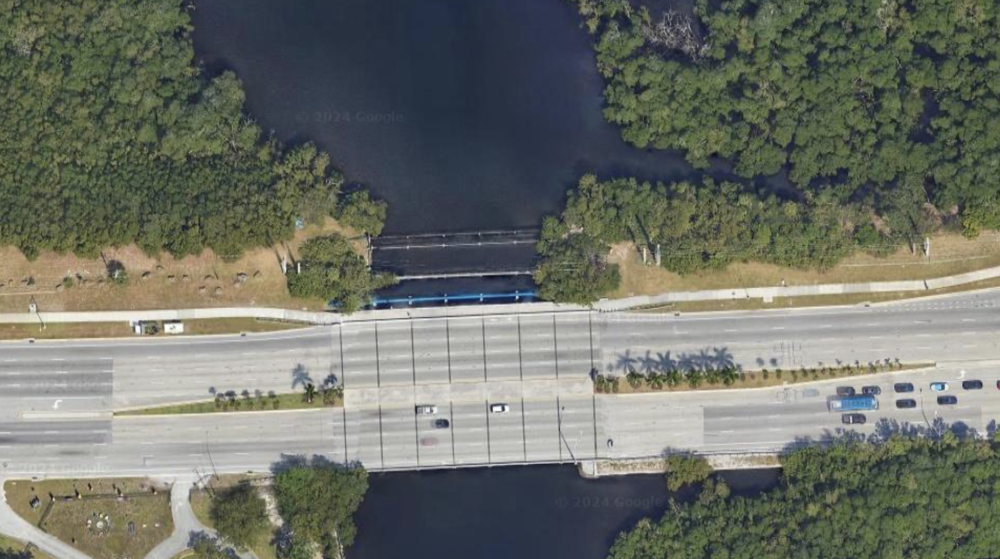

Zdjęcie wyjściowe: 
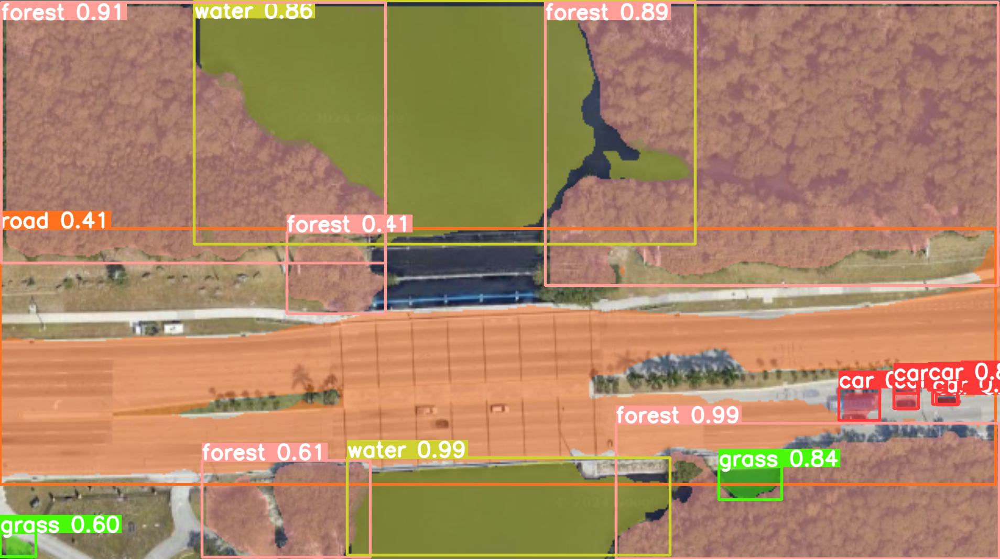

5. Poprawiona wersja predict.py z wyłączonymi boxami. 
   Jest to naljepsza wersja modelu. Cały projekt został zamieszczony na platformie Hugging Face. 
   Link: https://huggingface.co/pemix09/satellite-images-segmentation

In [5]:
model_path = 'runs/segment/train20/weights/best.pt'
image_path = 'test_wyspamlynska.png'

model = YOLO(model_path)
results = model.predict(image_path, save_conf=True, show_boxes=False, save=True)


image 1/1 c:\Users\karol\Pulpit\presentation_image_segmentation\test_wyspamlynska.png: 320x640 28 forests, 31 buildings, 1 water, 5 grasss, 153.9ms
Speed: 2.0ms preprocess, 153.9ms inference, 62.3ms postprocess per image at shape (1, 3, 320, 640)
Results saved to runs\segment\predict14


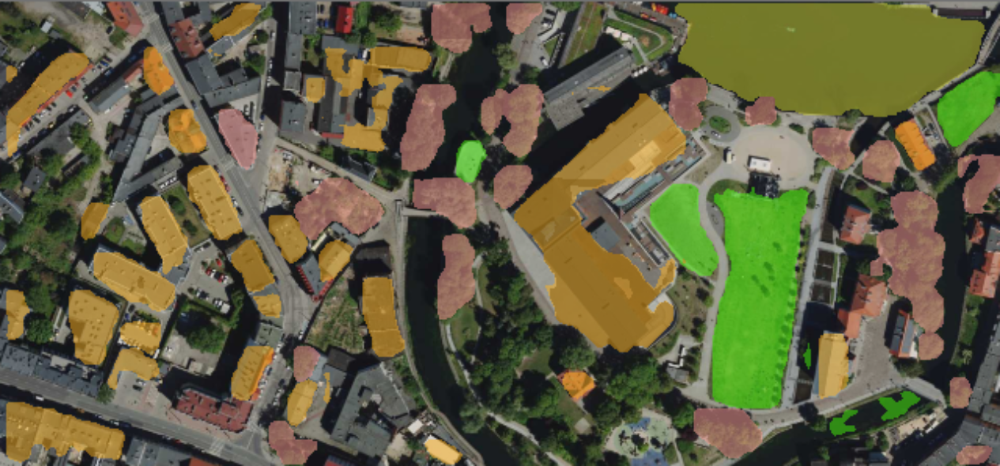

In [6]:
model_path = 'runs/segment/train20/weights/best.pt'
image_path = 'test_UAM.png'

model = YOLO(model_path)
results = model.predict(image_path, save_conf=True, show_boxes=False, save=True)


image 1/1 c:\Users\karol\Pulpit\presentation_image_segmentation\test_UAM.png: 288x640 1 car, 12 forests, 1 road, 8 buildings, 4 grasss, 123.4ms
Speed: 9.0ms preprocess, 123.4ms inference, 30.2ms postprocess per image at shape (1, 3, 288, 640)
Results saved to runs\segment\predict15


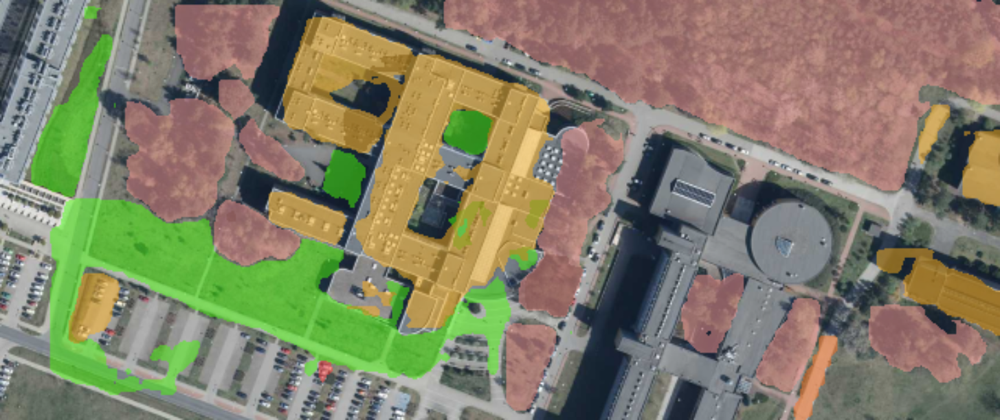

In [7]:
model_path = 'runs/segment/train20/weights/best.pt'
image_path = 'test_most.png'

model = YOLO(model_path)
results = model.predict(image_path, save_conf=True, show_boxes=False, save=True)


image 1/1 c:\Users\karol\Pulpit\presentation_image_segmentation\test_most.png: 384x640 7 cars, 5 forests, 1 road, 2 waters, 2 grasss, 174.2ms
Speed: 3.1ms preprocess, 174.2ms inference, 15.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\segment\predict16


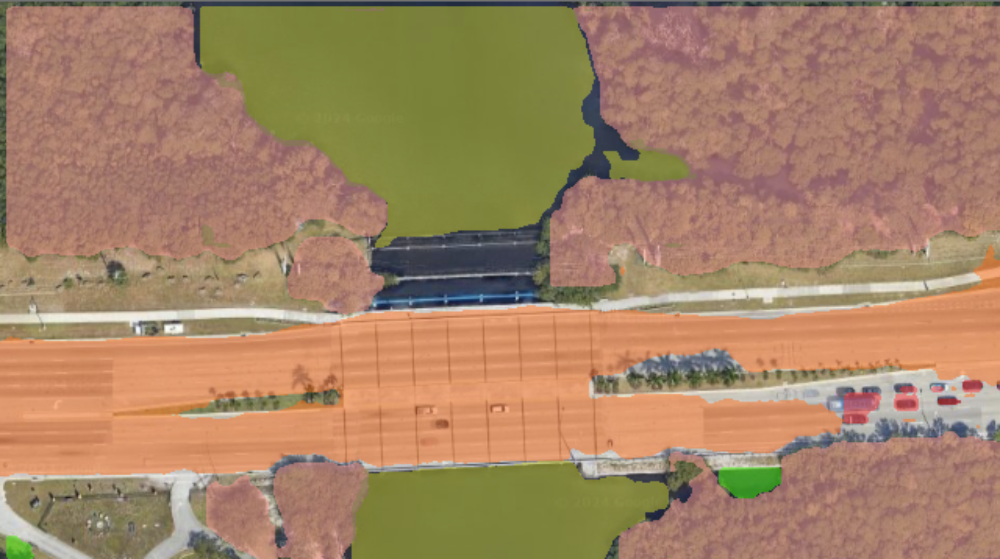

7. Krótka historia wczesniejszych werji modelu. 

In [8]:
model_path = 'runs/segment/train3_Karol/weights/best.pt'
image_path = 'test_most.png'

model = YOLO(model_path)
results = model.predict(image_path, save_conf=True, show_boxes=False, save=True)


image 1/1 c:\Users\karol\Pulpit\presentation_image_segmentation\test_most.png: 384x640 15 waters, 148.9ms
Speed: 3.1ms preprocess, 148.9ms inference, 15.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\segment\predict17


In [9]:
model_path = 'runs/segment/train19/weights/best.pt'
image_path = 'test_wyspamlynska.png'

model = YOLO(model_path)
results = model.predict(image_path, save_conf=True, show_boxes=False, save=True)


image 1/1 c:\Users\karol\Pulpit\presentation_image_segmentation\test_wyspamlynska.png: 320x640 (no detections), 124.5ms
Speed: 3.8ms preprocess, 124.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)
Results saved to runs\segment\predict18


<div style="display: flex; justify-content: space-around;">

  <div style="flex: 0 0 33%; margin: 2px;">
    train1 - train19
    <img src="images/test_most1.png" alt="Image 1" style="width: 100%;">
  </div>

  <div style="flex: 0 0 33%; margin: 2px;">
    incorrect model
    <img src="images/test_most2.png" alt="Image 2" style="width: 100%;">
  </div>

  <div style="flex: 0 0 33%; margin: 2px;">
    best version train20
    <img src="images/test_most3.png" alt="Image 3" style="width: 100%;">
  </div>

</div>

<div style="display: flex; justify-content: space-around;">

  <div style="flex: 0 0 33%; margin: 2px;">
    train1 - train19
    <img src="images/test_wyspamlynska1.png" alt="Image 1" style="width: 100%;">
  </div>

  <div style="flex: 0 0 33%; margin: 2px;">
    incorrect model
    <img src="images/test_wyspamlynska2.png" alt="Image 2" style="width: 100%;">
  </div>

  <div style="flex: 0 0 33%; margin: 2px;">
    best version train20
    <img src="images/test_wyspamlynska3.png" alt="Image 3" style="width: 100%;">
  </div>

</div>

- "incorect model" został wytrenowany do segmentacji budynków oraz zbiorników wodnych. 
- Nieprawidłowe działanie "incorrect model" spowodowane jest błędami w plikach treningowych, jak i konfiguracyjnych. 
- Głównym problemem mogły okazać się dane trenegowe, których maski zawierją obiekty tylko jednej klasy. Nie ma danych trenigowych z wyróżnionymi dwoma klasami na jednym zdjęciu. 
- Model trenowany był zdecydowanie najdłużej, bo "aż" 36 godzin (Nvidia GTX 1660 Ti). 

<div style="display: flex; justify-content: space-around;">

  <div style="flex: 0 0 45%; margin: 2px;">
    fractured image of buildings
    <img src="images/23579110_15.png" alt="Image 1" style="width: 100%;">
  </div>

  <div style="flex: 0 0 45%; margin: 2px;">
    mask of fractured image of buildings
    <img src="images/23579110_15_mask.png" alt="Image 2" style="width: 100%;">
  </div>

</div>

<div style="display: flex; justify-content: space-around;">

  <div style="flex: 0 0 45%; margin: 2px;">
    image of bildings and river
    <img src="images/23429005_15.png" alt="Image 1" style="width: 100%;">
  </div>

  <div style="flex: 0 0 45%; margin: 2px;">
    mask of buldings, but no river
    <img src="images/23429005_15_mask.png" alt="Image 2" style="width: 100%;">
  </div>

</div>